<a href="https://colab.research.google.com/github/Pratch-yani/Face_Shape_Classification/blob/main/6_MODEL_EVALUATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Face Shape Classification Evaluation

This notebook evaluates the 2 best CNN models (built from scratch vs. VGG-Face).  Analysis on confusion matrix, misclassification, and prediction probabilities.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Import Libraries

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import cv2
import pickle
import pandas as pd
import itertools
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix

%matplotlib inline


In [16]:
import random
import tensorflow as tf
from tensorflow.keras import utils
import pandas as pd
import seaborn as sns

### Define Functions

In [3]:
cm_plot_labels = ['Heart','Oblong','Oval','Round', 'Square']
fig_path = '/content/drive/My Drive/archive/Face_Shape_Classification/images/'

def create_confusion_matrix(y_test_labels, y_preds, classes, title='Confusion Matrix',
                            normalize=False, cmap=plt.cm.Blues):

    cm = confusion_matrix(y_test_labels, y_preds)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    # print(cm)

    plt.figure(figsize=(16,8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize = 15)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig(f"{fig_path+title}.png");    # for saving images to .png file
    plt.show()

In [4]:
y_label_dict = {0: 'Heart', 1: 'Oblong', 2: 'Oval', 3: 'Round', 4: 'Square'}

def show_X_img(num, index_array, X_array, y_actual, fig_title, ncols=1):
    '''this function display images from an image array'''
    ncols= ncols
    nrows= int(num/ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize =(ncols*4,nrows*4))
    fig.suptitle(fig_title, size = 20)
    ax = ax.ravel()
    for i, index in enumerate(index_array):
        img = X_array[index] * 255
        img = np.asarray(img, int)
        label = y_label_dict[y_actual[index]]
        ax[i].imshow(img, cmap='gray')
        ax[i].set_title(label, size=16)




In [5]:
def compare_misclass(df, predict, fig_title='Comparing Misclassification', ax_title=''):
    fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(15,5))
    fig.suptitle(fig_title, fontsize=16)
    ax[0].hist(df.y_actual, bins=9, color='lightcoral')
    ax[0].set_xticks(range(0,5))
    ax[0].set_xticklabels(cm_plot_labels)
    ax[0].set_title(f'{ax_title}\n ACTUAL CLASS')
    ax[1].hist(df[predict], bins=9, color='mediumturquoise')
    ax[1].set_xticks(range(0,5))
    ax[1].set_xticklabels(cm_plot_labels)
    ax[1].set_title(f'{ax_title}\n PREDICTED CLASS');
    plt.savefig(f"{fig_path+fig_title}.png");

In [6]:
def plot_misclass_img_proba(df, list_index):
  for i in list_index:
    img = X_test[i] * 255
    img = np.asarray(img, int)
    label = y_label_dict[y_actual[i]]

    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(img, cmap='gray')
    plt.title(label, size=16)
    plt.subplot(1,3,2)
    df.loc[i, ['heart_s', 'oblong_s', 'oval_s', 'round_s','square_s']].plot(kind='bar', color='pink')
    plt.title('Probabilities - CNN from scratch', fontsize=14, y=1.01)
    plt.subplot(1,3,3)
    df.loc[i, ['heart_t', 'oblong_t', 'oval_t', 'round_t','square_t']].plot(kind='bar', color='plum')
    plt.title('Probabilities - CNN transfer learning', fontsize=14, y=1.01);

In [8]:
def create_data_files(directory, array, resize=(224,224)):

    i=0
    for category in categories:
        path = os.path.join(directory, category)
        class_num = categories.index(category)
        img_list = os.listdir(path)
        try:
            for img in img_list:
                img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_GRAYSCALE)
                if resize != None:
                  img_array = cv2.resize(img_array, resize)
                array.append([img_array, class_num])
                i += 1
        except Exception as e:
                print(f'Error: \n category: {category}\n image: {img}')


        if i % 200 == 0:
            print(f"Images processed: {i} of {len(img_list*len(categories))}")

In [11]:
def train_test_prep(training_data_array, testing_data_array):

    # shuffle the images to mix all the 5 classes randomly
    random.shuffle(training_data_array)
    random.shuffle(testing_data_array)

    # read and split X_train, X_test, y_train, y_test into an array
    X_train = []
    y_train = []
    X_test = []
    y_test = []

    for features, label in training_data_array:
        X_train.append(features)
        y_train.append(label)

    for features, label in testing_data_array:
        X_test.append(features)
        y_test.append(label)
    X_train = np.array(X_train, dtype=float)
    X_test = np.array(X_test, dtype=float)

    X_train = X_train/255
    X_test = X_test/255

    # change values of y to categorical
    y_train = utils.to_categorical(y_train, 5)
    y_test = utils.to_categorical(y_test, 5)

    return(X_train, X_test, y_train, y_test)

### Import data files



In [7]:
label_map = {0:'Heart', 1: 'Oblong', 2: 'Oval', 3: 'Round', 4: 'Square'}
train_dir = '/content/drive/My Drive/archive/FaceShape Dataset/training_set'
test_dir = '/content/drive/My Drive/archive/FaceShape Dataset/testing_set'
example_dir = '/content/drive/My Drive/archive/FaceShape Dataset/examples'
categories = ['Heart','Oblong','Oval','Round','Square']

In [9]:
path = "/content/drive/My Drive/archive/FaceSHapeDataset/"



In [10]:
training_data = []
testing_data = []

create_data_files(train_dir, training_data)
create_data_files(test_dir, testing_data)


Images processed: 800 of 4000
Error: 
 category: Oblong
 image: oblong (724).jpg
Images processed: 200 of 1000
Images processed: 400 of 1000
Images processed: 600 of 1000
Error: 
 category: Round
 image: desktop.ini


In [17]:
X_train, X_test, y_train, y_test = train_test_prep(training_data, testing_data)

print(f'X_train.shape {X_train.shape}')
print(f'X_test.shape {X_test.shape}')
print(f'y_train.shape {y_train.shape}')
print(f'y_test.shape {y_test.shape}')

X_train.shape (3761, 224, 224)
X_test.shape (806, 224, 224)
y_train.shape (3761, 5)
y_test.shape (806, 5)


### Load saved models for evaluation

Both Convolutional Neural Network (CNN) models to be evaluated are generated from RGB color images with augmentation.  

- New model built from scratch `new`
- Transfer Learning from VGG Face `transfer`

In [18]:
# New model from scratch


mod_scratch = tf.keras.models.load_model("/content/drive/MyDrive/archive/rgb_oct12_3.keras")



In [19]:
# Transfer Learning model from VGG-Face


mod_transfer = tf.keras.models.load_model("/content/drive/MyDrive/archive/face_classification_final2.h5")

### Make predictions


First we generate predictions and prediction probabilities from the saved models.  This will be used in analysis and visualizations in next steps without having to load the model every time.

In [22]:
# Expand grayscale (32, 224, 224) to (32, 224, 224, 3) by repeating the channel
X_test_rgb = np.repeat(X_test[..., np.newaxis], 3, axis=-1)

# Now predict with the RGB-converted data


In [23]:
# Make predictions
y_actual = np.argmax(y_test, axis=-1)
y_predict_scratch = np.argmax(mod_scratch.predict(X_test), axis=1)
y_predict_transfer = np.argmax(mod_transfer.predict(X_test_rgb), axis=1)


26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 538ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 497s 19s/step


In [25]:
# Generate predict probabilities
predict_proba_scratch = mod_scratch.predict(X_test)
predict_proba_transfer = mod_transfer.predict(X_test_rgb)

26/26 ━━━━━━━━━━━━━━━━━━━━ 14s 508ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 496s 19s/step


In [26]:
mod_scratch.evaluate(X_test, y_test)

26/26 ━━━━━━━━━━━━━━━━━━━━ 17s 622ms/step - accuracy: 0.3557 - loss: 2.9410


[2.943314552307129, 0.3436724543571472]

In [27]:
mod_transfer.evaluate(X_test_rgb, y_test)

26/26 ━━━━━━━━━━━━━━━━━━━━ 494s 19s/step - accuracy: 0.6192 - loss: 1.8656


[1.8615721464157104, 0.6153846383094788]

Normalized confusion matrix


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/archive/Face_Shape_Classification/images/Confusion Matrix - CNN Model without Transfer Learning.png'

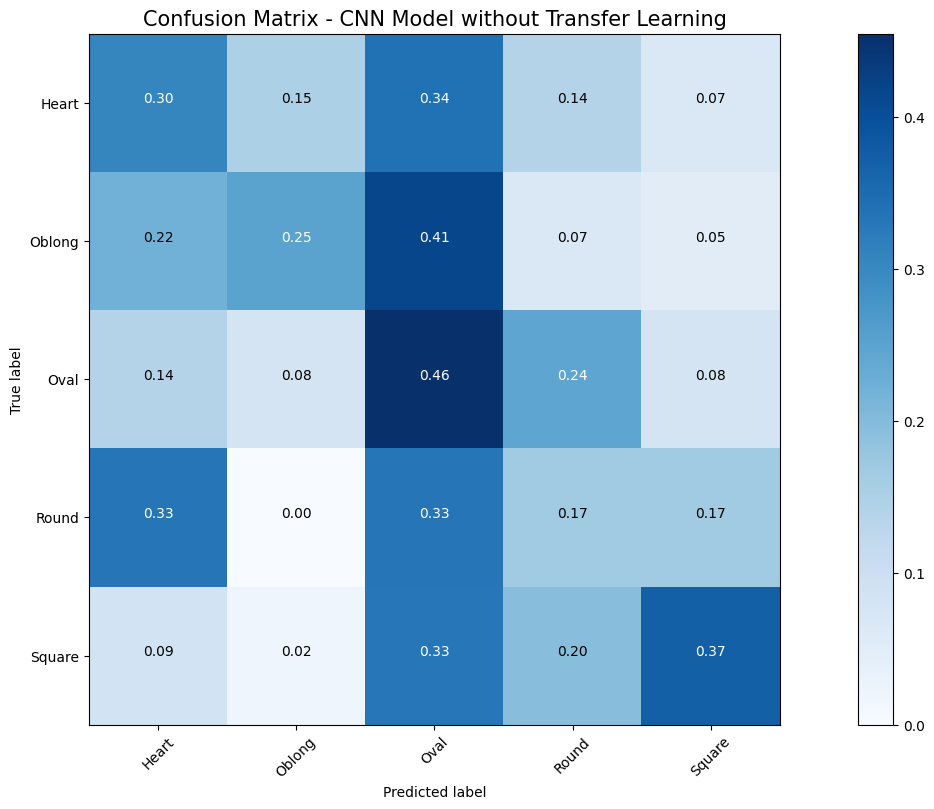

In [28]:
create_confusion_matrix(y_actual, y_predict_scratch, cm_plot_labels,
                        title='Confusion Matrix - CNN Model without Transfer Learning',
                        normalize=True, cmap=plt.cm.Blues)

Normalized confusion matrix


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/archive/Face_Shape_Classification/images/Confusion Matrix - CNN Model with Transfer Learning.png'

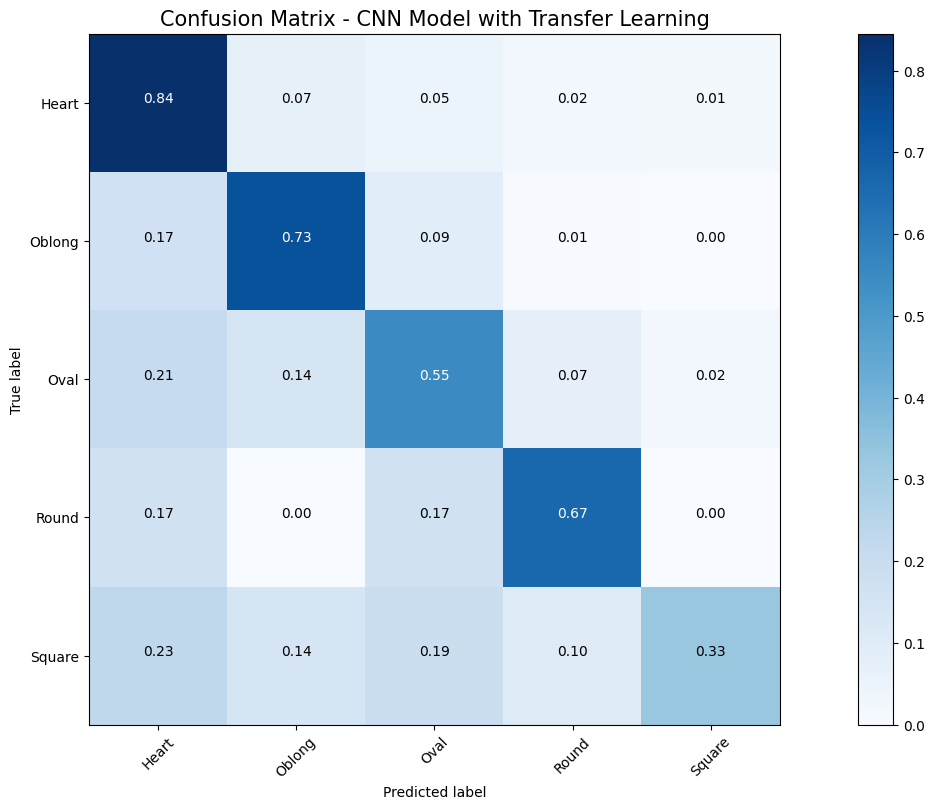

In [29]:
create_confusion_matrix(y_actual, y_predict_transfer, cm_plot_labels,
                        title='Confusion Matrix - CNN Model with Transfer Learning',
                        normalize=True, cmap=plt.cm.Blues)

### Analysis of misclassification

In [30]:
def create_df(y_actual, y_predict, predict_proba, X_test, y_test):
  '''this function creates a dataframe with predictions and probabilities of a model'''
  # generate predictions

  actual = pd.DataFrame(y_actual, columns=['y_actual'])
  predict = pd.DataFrame(y_predict, columns=['y_predict'])

  # generate prediction probabilities

  probability_list = []
  for i, item in enumerate(predict_proba):
    probabilities = {}
    probabilities['heart'] = round(item[0] * 100,2)
    probabilities['oblong'] = round(item[1] * 100,2)
    probabilities['oval'] = round(item[2] *100,2)
    probabilities['round'] = round(item[3] *100,2)
    probabilities['square'] = round(item[4] *100,2)
    probability_list.append(probabilities)
  proba = pd.DataFrame(probability_list)

  # create dataframe
  df = pd.concat([actual, predict, proba],axis=1)

  return df


In [31]:
scratch = create_df(y_actual, y_predict_scratch, predict_proba_scratch, X_test, y_test)

transfer = create_df(y_actual, y_predict_transfer, predict_proba_transfer, X_test, y_test)

In [32]:
# dataframe for model built from scratch
scratch.columns = [x + '_s' for x in scratch.columns]
scratch.head()

,y_actual_s,y_predict_s,heart_s,oblong_s,oval_s,round_s,square_s
0,2,2,18.110001,20.420000,37.959999,10.13,13.380000
1,4,0,43.770000,4.200000,10.420000,1.96,39.639999
2,0,0,58.990002,19.780001,21.230000,0.00,0.000000
3,4,4,0.000000,0.000000,0.270000,1.44,98.290001
4,2,4,0.000000,0.000000,1.470000,5.44,93.089996


In [33]:
# dataframe for model with transfer learning
transfer.columns = [x + '_t' for x in transfer.columns]
transfer.head()

,y_actual_t,y_predict_t,heart_t,oblong_t,oval_t,round_t,square_t
0,2,2,0.000000,0.00,100.00,0.000000,0.00
1,4,1,0.000000,100.00,0.00,0.000000,0.00
2,0,0,99.050003,0.00,0.94,0.000000,0.00
3,4,3,3.010000,0.02,8.73,56.910000,31.33
4,2,3,0.010000,0.00,41.52,58.470001,0.00


In [34]:
# combine the data frame for evaluations
evaluations = pd.concat([scratch, transfer], axis=1)

# drop one of the y_actual as they are the same
evaluations = evaluations.drop(columns='y_actual_t')
evaluations = evaluations.rename(columns={'y_actual_s': 'y_actual'})

# create columns with actual labels
evaluations['actual'] = evaluations['y_actual'].map(y_label_dict)
evaluations['s_predict'] = evaluations['y_predict_s'].map(y_label_dict)
evaluations['t_predict'] = evaluations['y_predict_t'].map(y_label_dict)

# create new columns to detect where the 2 models misclassify, and the differences in predictions
evaluations['predict_diff'] = evaluations['y_predict_s'] - evaluations['y_predict_t']
evaluations['t_misclass'] = evaluations['y_actual'] - evaluations['y_predict_t']
evaluations['s_misclass'] = evaluations['y_actual'] - evaluations['y_predict_s']

evaluations

,y_actual,y_predict_s,heart_s,oblong_s,oval_s,round_s,square_s,y_predict_t,heart_t,oblong_t,oval_t,round_t,square_t,actual,s_predict,t_predict,predict_diff,t_misclass,s_misclass
0,2,2,18.110001,20.420000,37.959999,10.130000,13.380000,2,0.000000,0.000000,100.000000,0.000000,0.00,Oval,Oval,Oval,0,0,0
1,4,0,43.770000,4.200000,10.420000,1.960000,39.639999,1,0.000000,100.000000,0.000000,0.000000,0.00,Square,Heart,Oblong,-1,3,4
2,0,0,58.990002,19.780001,21.230000,0.000000,0.000000,0,99.050003,0.000000,0.940000,0.000000,0.00,Heart,Heart,Heart,0,0,0
3,4,4,0.000000,0.000000,0.270000,1.440000,98.290001,3,3.010000,0.020000,8.730000,56.910000,31.33,Square,Square,Round,1,1,0
4,2,4,0.000000,0.000000,1.470000,5.440000,93.089996,3,0.010000,0.000000,41.520000,58.470001,0.00,Oval,Square,Round,1,-1,-2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
801,4,2,0.010000,0.000000,34.630001,32.599998,32.759998,3,11.500000,0.050000,9.290000,47.330002,31.83,Square,Oval,Round,-1,1,2
802,1,2,26.280001,30.650000,42.000000,0.470000,0.600000,0,54.759998,39.599998,5.490000,0.050000,0.11,Oblong,Oval,Heart,2,1,-1
803,0,2,26.030001,30.290001,42.349998,0.580000,0.750000,0,99.720001,0.270000,0.000000,0.000000,0.00,Heart,Oval,Heart,2,0,-2
804,1,2,15.880000,17.830000,34.439999,13.700000,18.150000,2,0.000000,1.940000,98.000000,0.020000,0.03,Oblong,Oval,Oval,0,-1,-1


In [35]:
print('SUMMARY OF MISCLASSIFICATION')

correct = evaluations[(evaluations.y_predict_t == evaluations.y_actual) & (evaluations.y_predict_s == evaluations.y_actual)]
print(f'\nNumber of images that both models predicted correctly are {correct.shape[0]}')

misclass = evaluations[(evaluations.y_predict_t != evaluations.y_actual) | (evaluations.y_predict_s != evaluations.y_actual)]
print(f'Number of images that are misclassified by either of the models are {misclass.shape[0]}')
print(f'\n--------------------------------------------------------------------------------------\n')

# where both models predicted incorrectly
both_wrong = misclass[(misclass.s_misclass != 0) & (misclass.t_misclass != 0)]
both_wrong_same = misclass[((misclass.s_misclass != 0) & (misclass.t_misclass != 0)) & (misclass.t_misclass == misclass.s_misclass)]
both_wrong_different = misclass[((misclass.s_misclass != 0) & (misclass.t_misclass != 0)) & (misclass.t_misclass != misclass.s_misclass)]
print(f"Both models predicted incorrectly: {both_wrong.shape[0]}")
print(f"Same class: {both_wrong_same.shape[0]}")
print(f"Different class: {both_wrong_different.shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')

# where transfer learning improved predictions vs. the model from scratch
t_misclass = misclass[(misclass.t_misclass != 0)]
print(f"Transfer learning predicted incorrectly: {misclass[(misclass.t_misclass != 0)].shape[0]}")
print(f"Model from scratch predicted correctly: {misclass[(misclass.t_misclass != 0) & (misclass.s_misclass == 0)].shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')

# where model from scratch predicted correctly, but the transfer learning did not
s_misclass = misclass[(misclass.s_misclass != 0)]
print(f"Transfer learning predicted incorrectly: {misclass[(misclass.s_misclass != 0)].shape[0]}")
print(f"Model from scratch predicted correctly: {misclass[(misclass.s_misclass != 0) & (misclass.t_misclass == 0)].shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')


SUMMARY OF MISCLASSIFICATION

Number of images that both models predicted correctly are 194
Number of images that are misclassified by either of the models are 612

--------------------------------------------------------------------------------------

Both models predicted incorrectly: 227
Same class: 82
Different class: 145

--------------------------------------------------------------------------------------

Transfer learning predicted incorrectly: 310
Model from scratch predicted correctly: 83

--------------------------------------------------------------------------------------

Transfer learning predicted incorrectly: 529
Model from scratch predicted correctly: 302

--------------------------------------------------------------------------------------



### Compare misclassification between 2 models
Transfer learning misclassification is mainly on OVAL shape, while the misclassification for the model from scratch is more spread across different classes.

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/archive/Face_Shape_Classification/images/Missclassified:  Transfer Learning Model only (32 images).png'

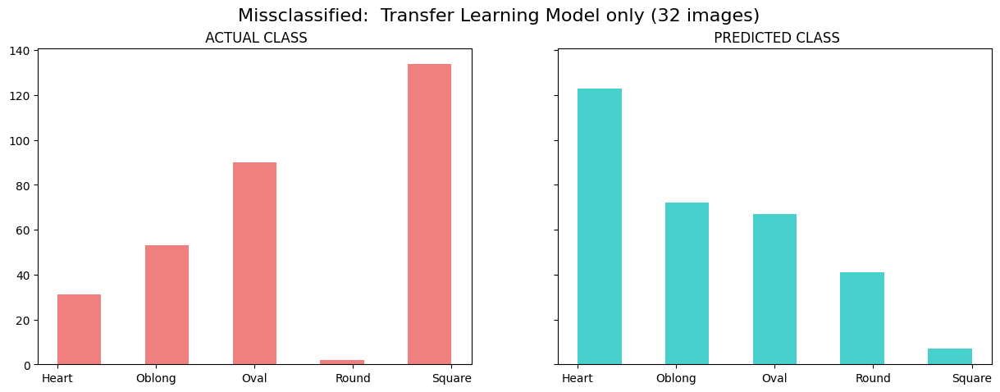

In [36]:
compare_misclass(t_misclass, 'y_predict_t', fig_title='Missclassified:  Transfer Learning Model only (32 images)', ax_title='')

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/archive/Face_Shape_Classification/images/Missclassified:  NON-Transfer Learning Model only (190 images).png'

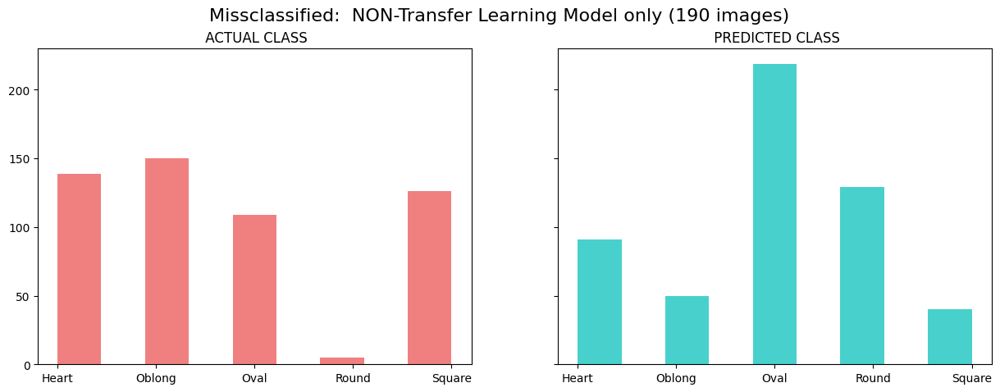

In [37]:
compare_misclass(s_misclass, 'y_predict_s', fig_title='Missclassified:  NON-Transfer Learning Model only (190 images)', ax_title='')

### BOTH models misclassify the SAME CLASS:

<ipython-input-6-535f3844bc4e>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,5))


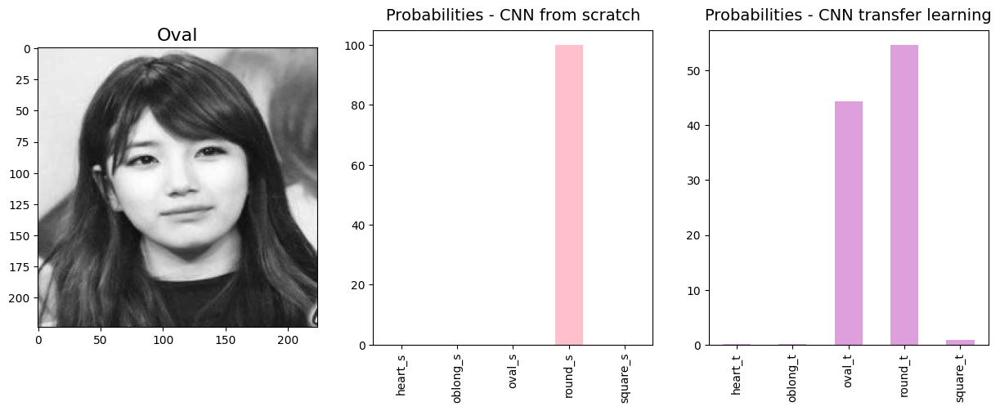

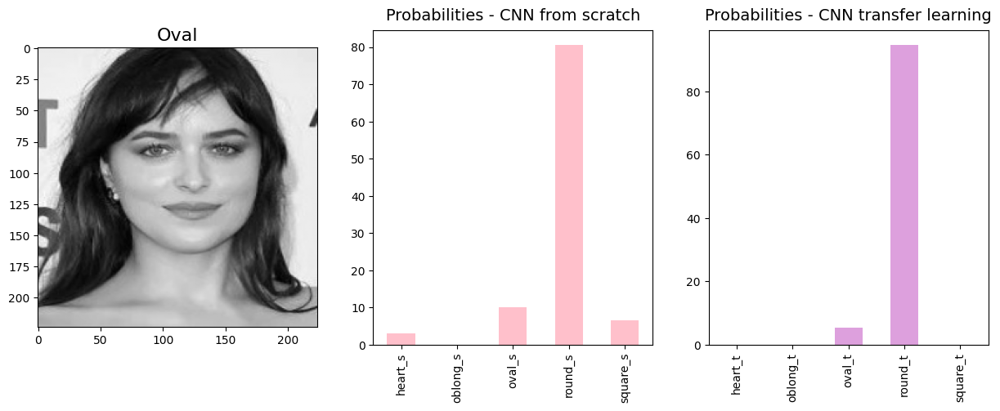

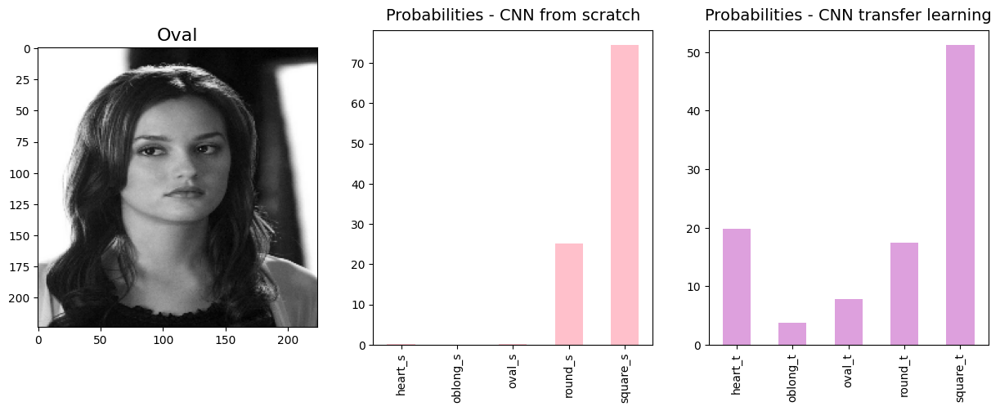

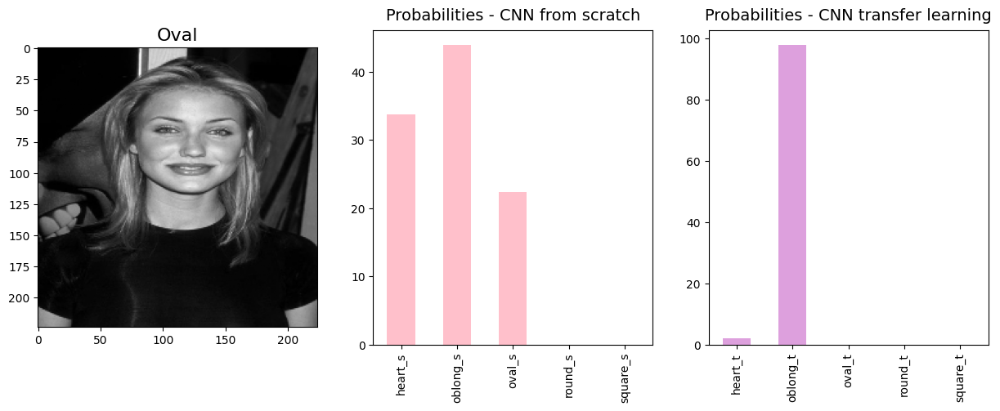

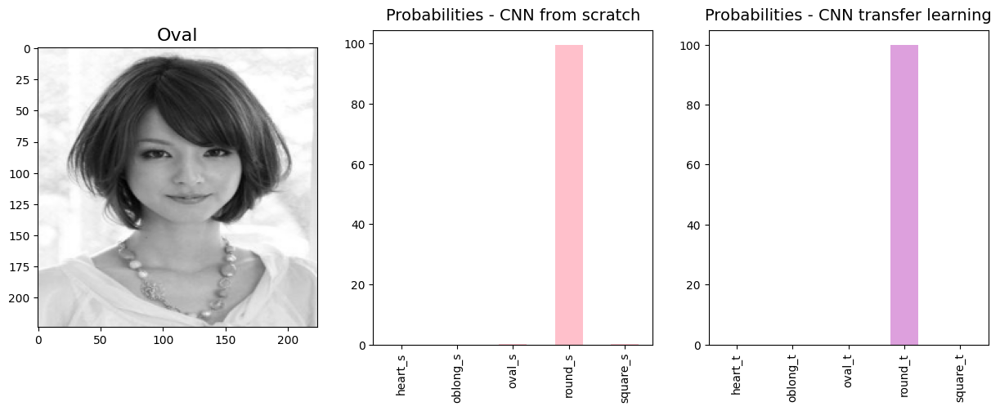

...

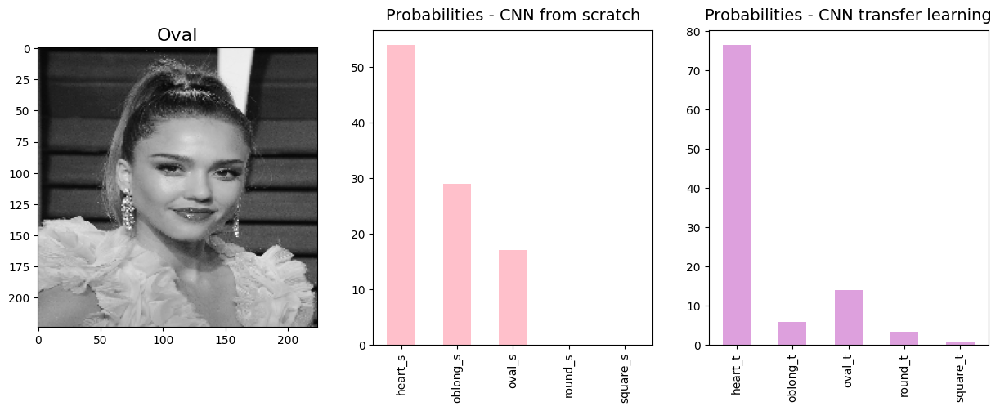

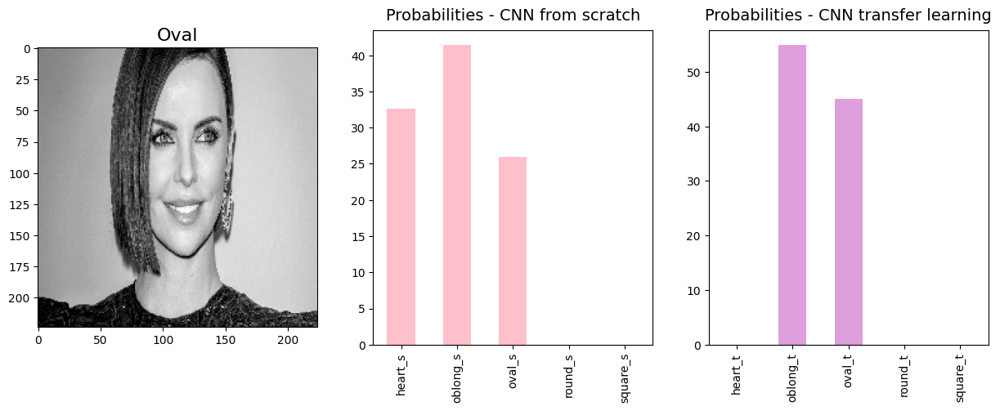

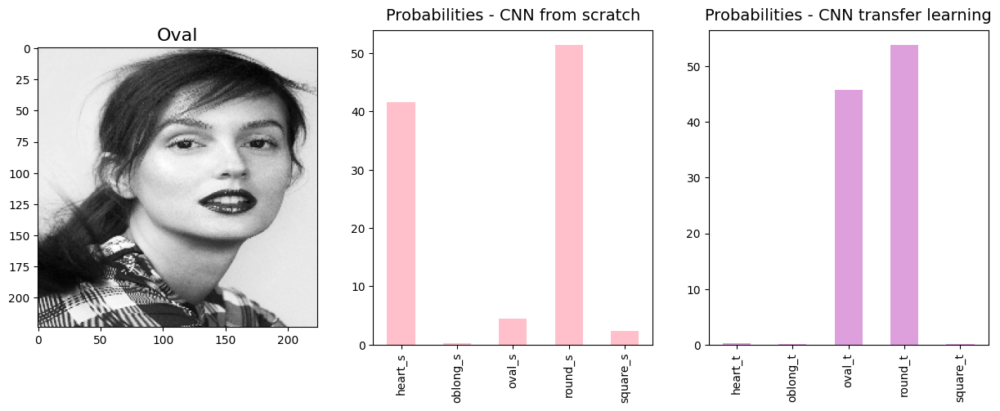

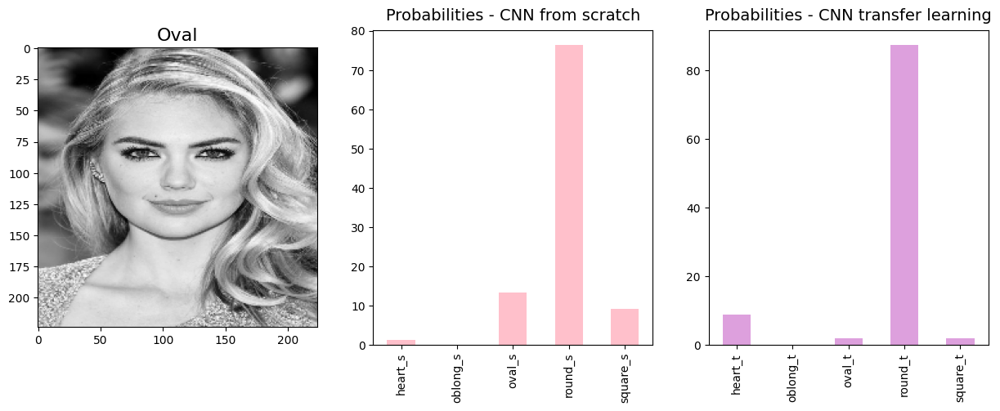

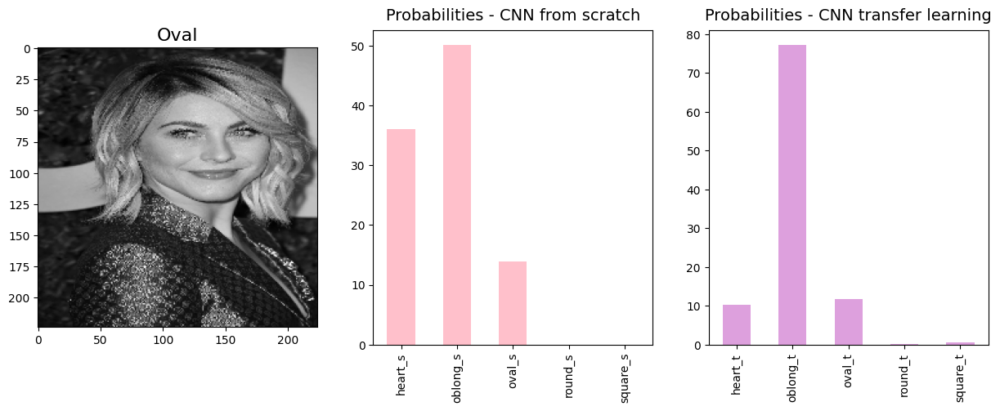

In [38]:
# identify and plot 20 images where both models misclassify, but incorrectly predicted different classes.

both_wrong_same_index = both_wrong_same[(both_wrong_same.actual == 'Oval')].head(30).index
plot_misclass_img_proba(both_wrong_same[(both_wrong_same.actual == 'Oval')].head(30), both_wrong_same_index)

### BOTH models misclassify DIFFERENT CLASSES:

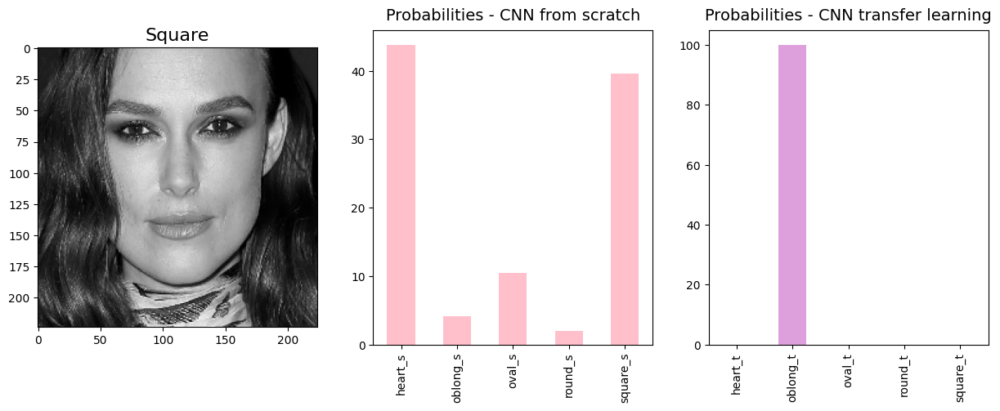

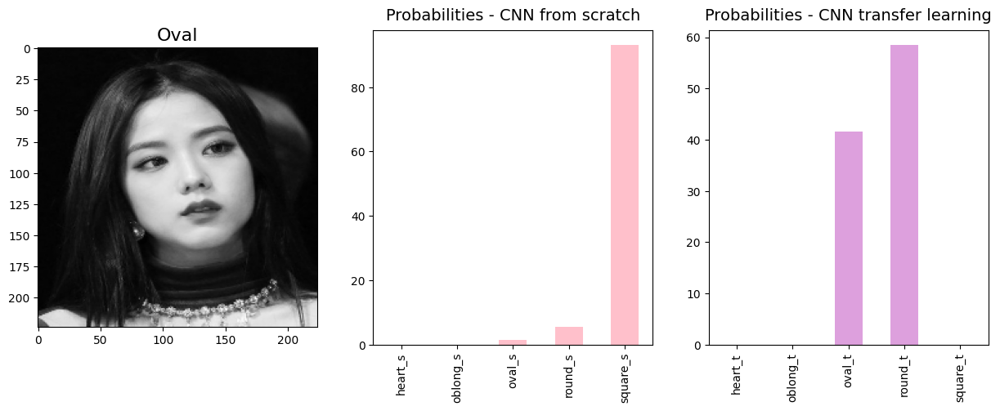

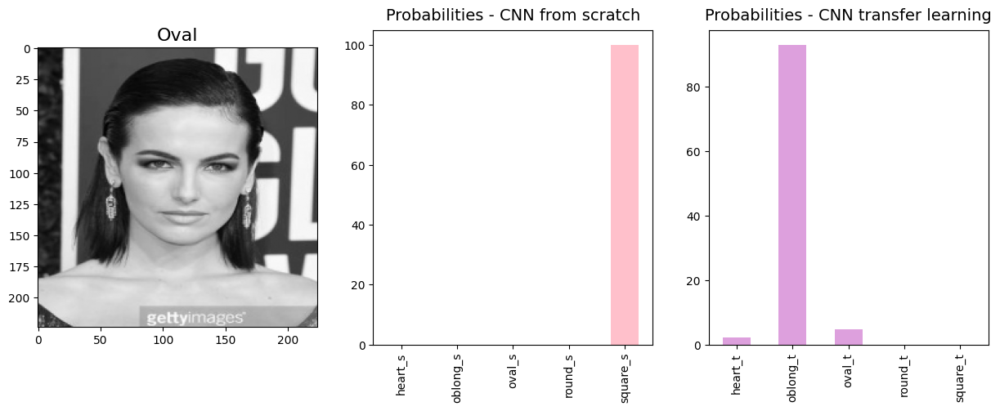

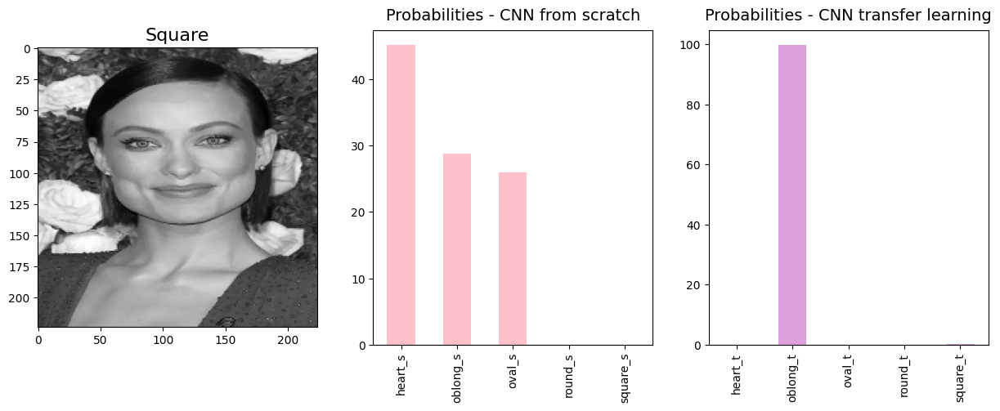

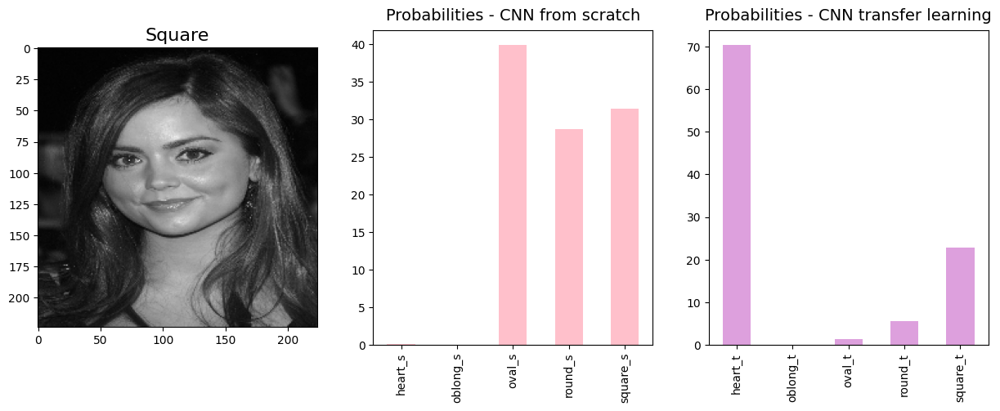

...

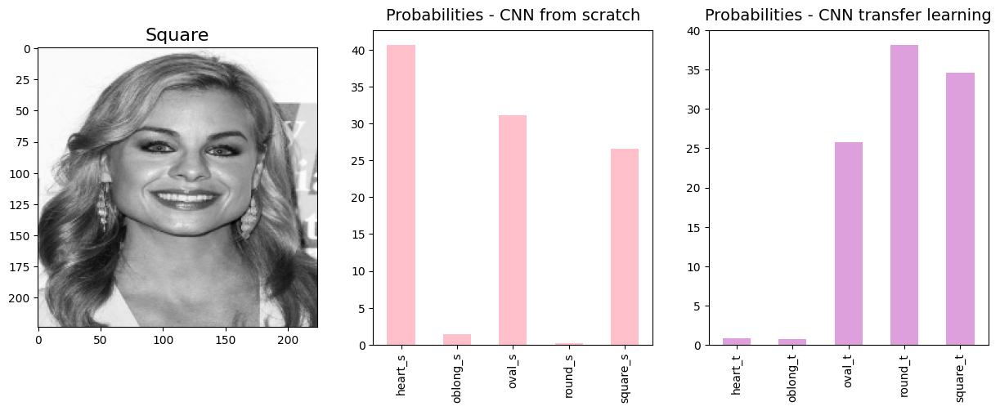

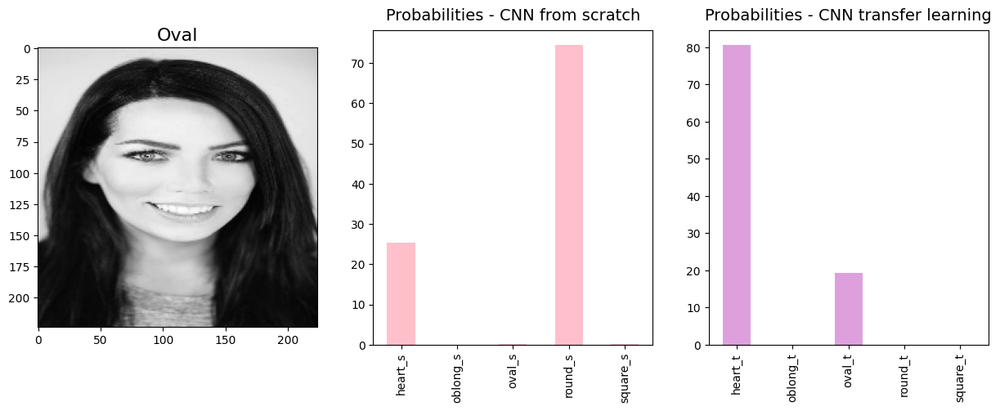

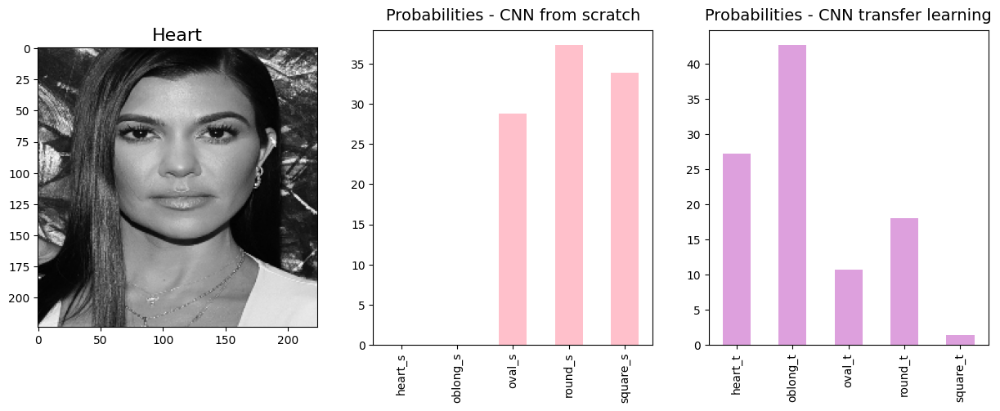

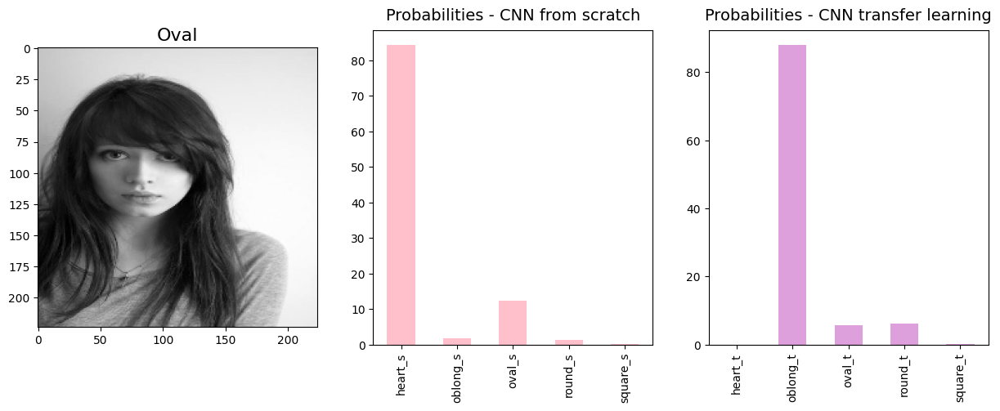

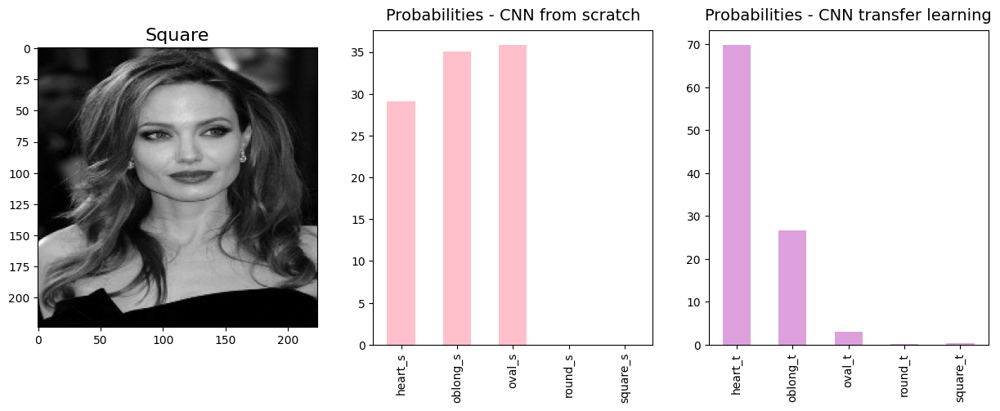

In [39]:
# identify and plot 20 images where both models misclassify, but incorrectly predicted different classes.

both_wrong_different_index = both_wrong_different.head(20).index
plot_misclass_img_proba(both_wrong_different.head(20), both_wrong_different_index)

### Transfer Learning Misclassification

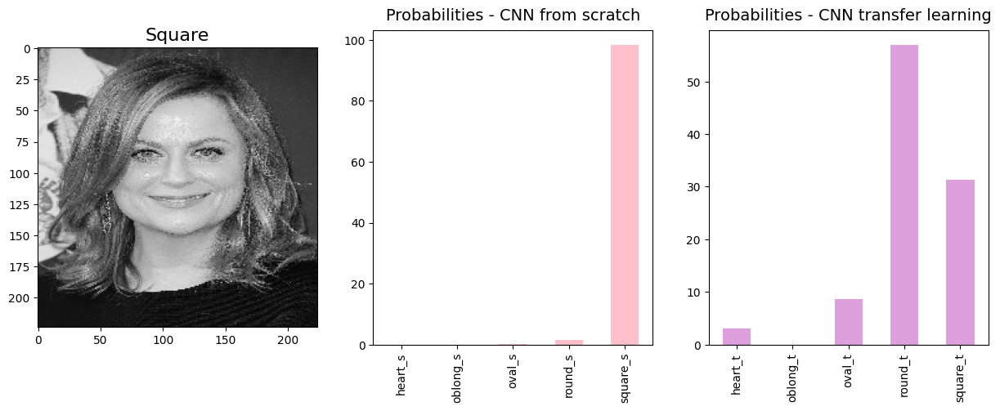

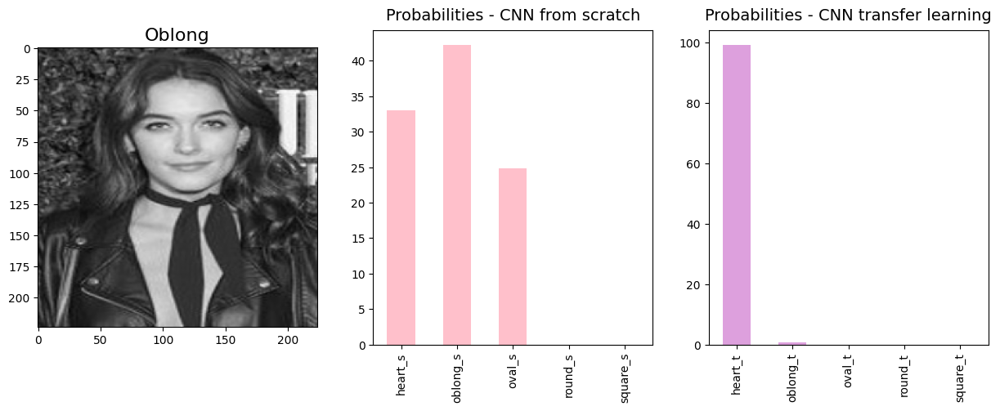

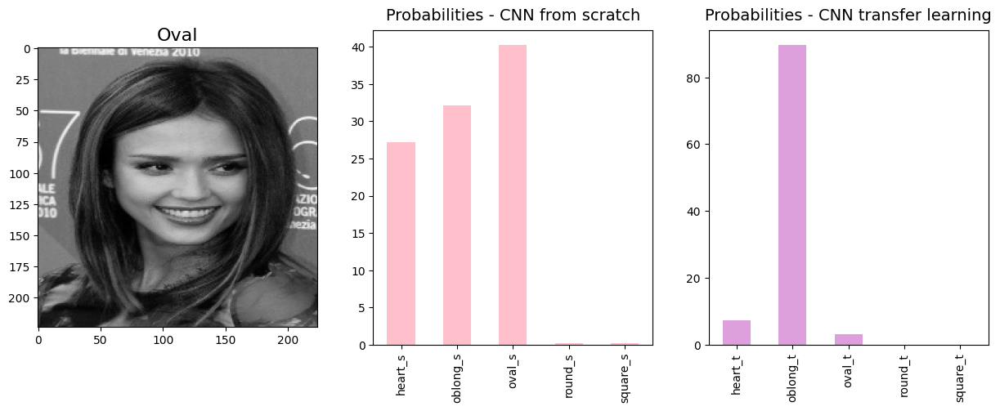

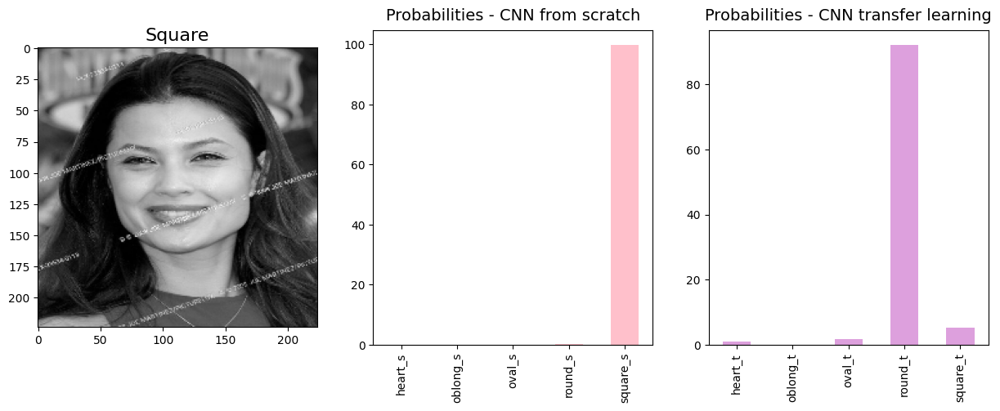

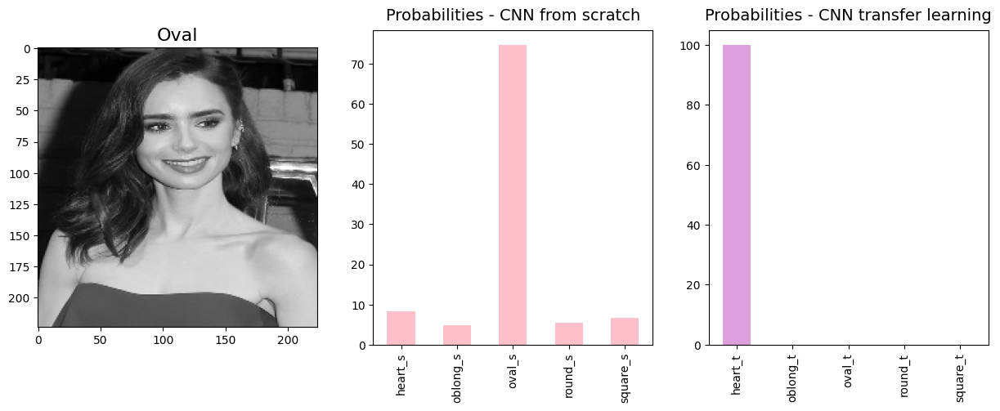

...

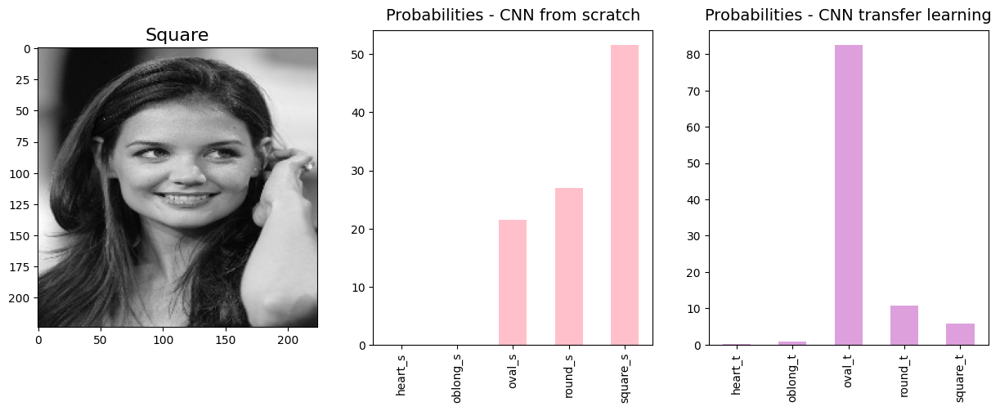

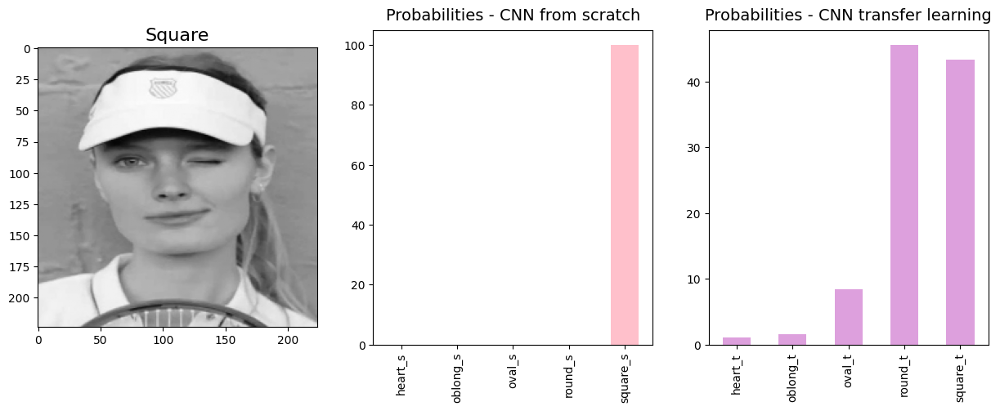

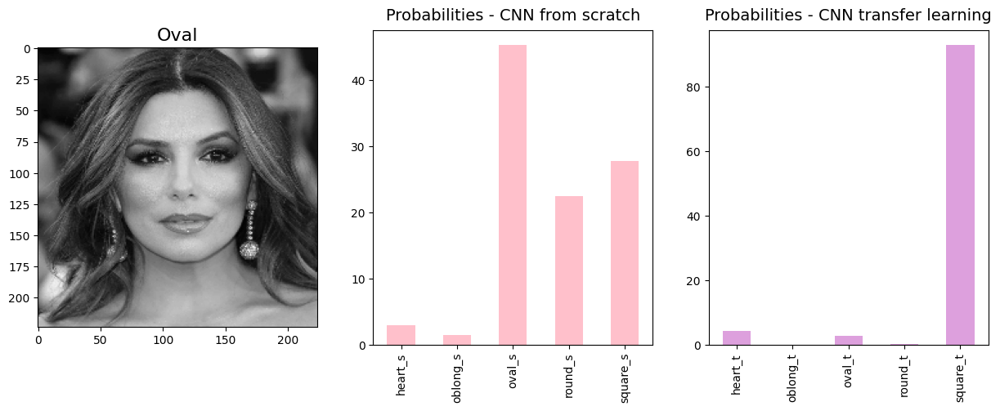

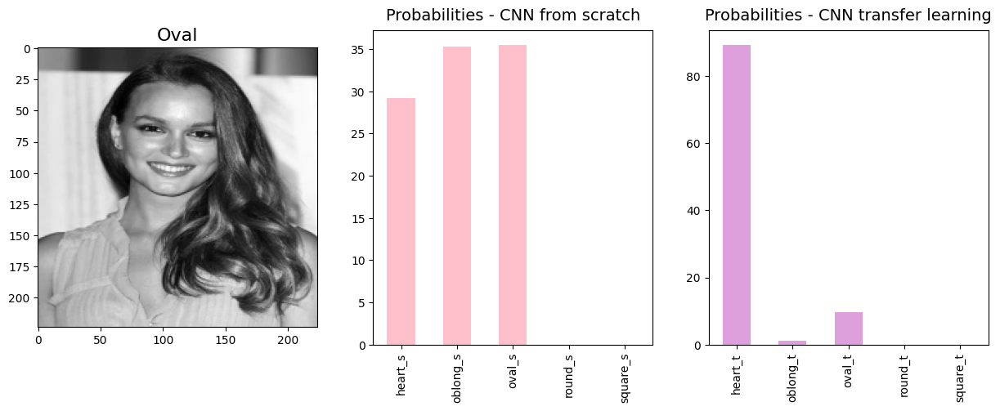

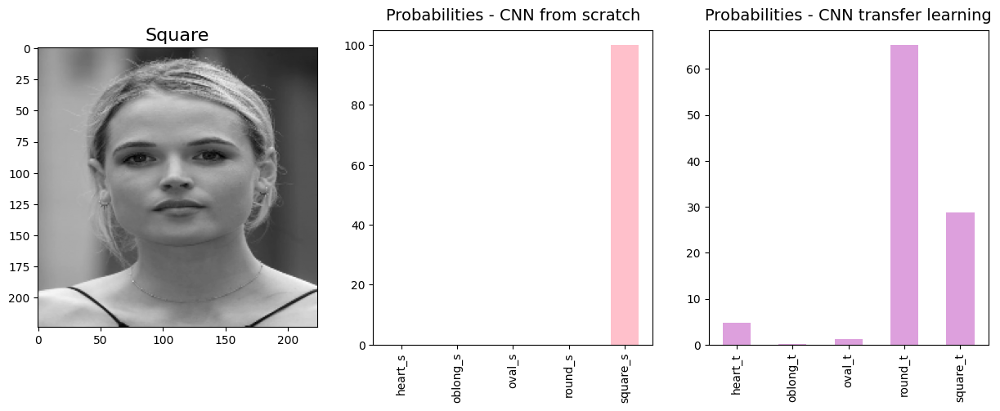

In [40]:
# identify and plot 20 images where Transfer Learning misclassifies, but Model from scratch correctly predicted.

t_misclass_index = t_misclass[(t_misclass.s_misclass == 0)].head(20).index
plot_misclass_img_proba(t_misclass[(t_misclass.s_misclass == 0)].head(20), t_misclass_index)

### CNN from Scratch Misclassification -- How transfer learning improved probability of the predicted class to 100%

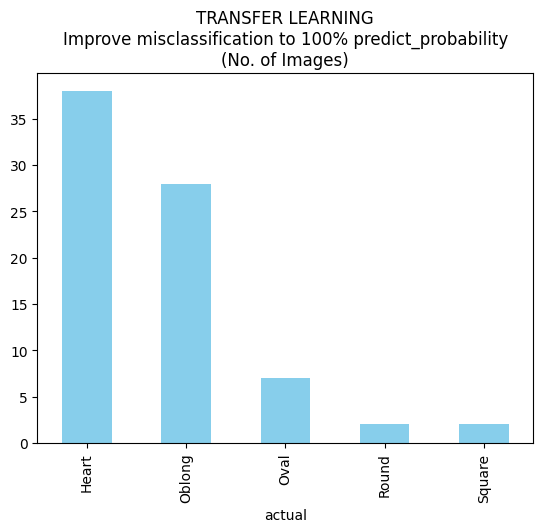

In [41]:
# filter where CNN from scratch misclassification, while Transfer Learning has 100% probability on the predicted class
mask_100 = ((s_misclass.heart_t == 100) | (s_misclass.oblong_t == 100) | (s_misclass.oval_t == 100) |
            (s_misclass.round_t == 100) | (s_misclass.square_t == 100))
s_misclass_t100 = s_misclass[(mask_100)]
s_misclass_t100.groupby('actual')['y_actual'].count().plot(kind='bar', color='skyblue')
plt.title('TRANSFER LEARNING\nImprove misclassification to 100% predict_probability\n(No. of Images)');
plt.savefig(f"transfer_100.png");

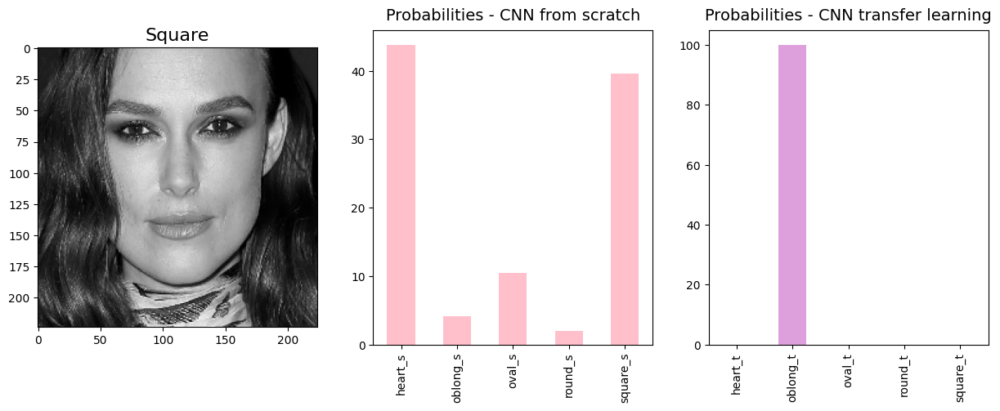

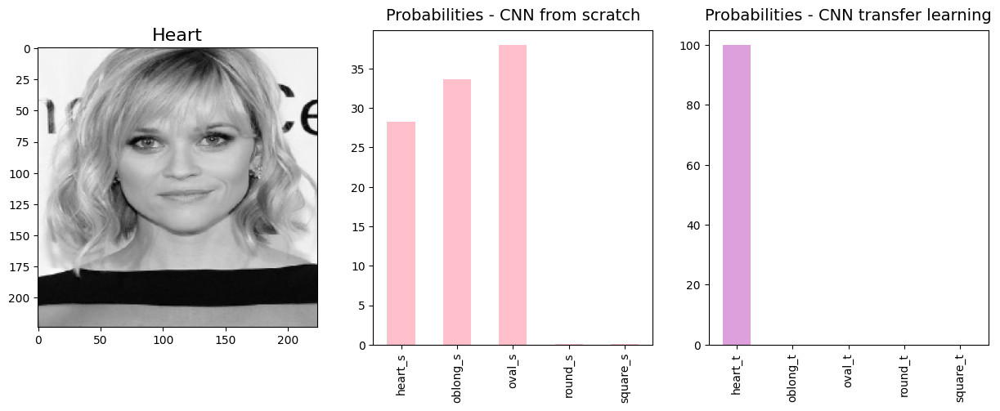

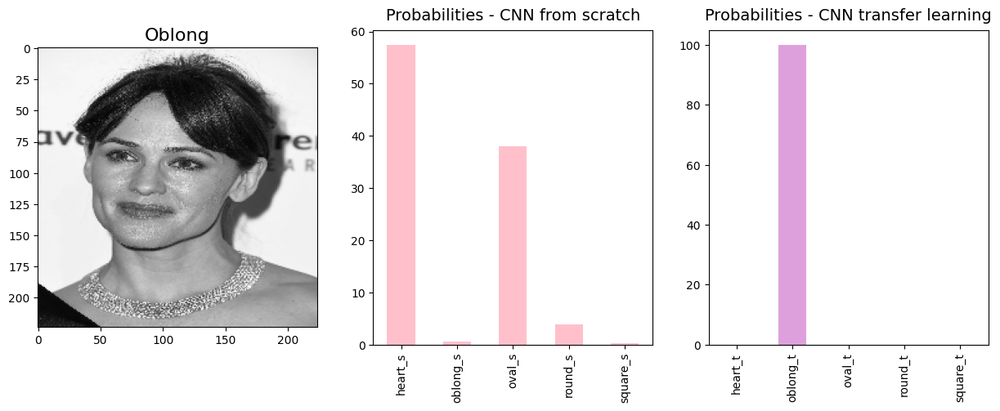

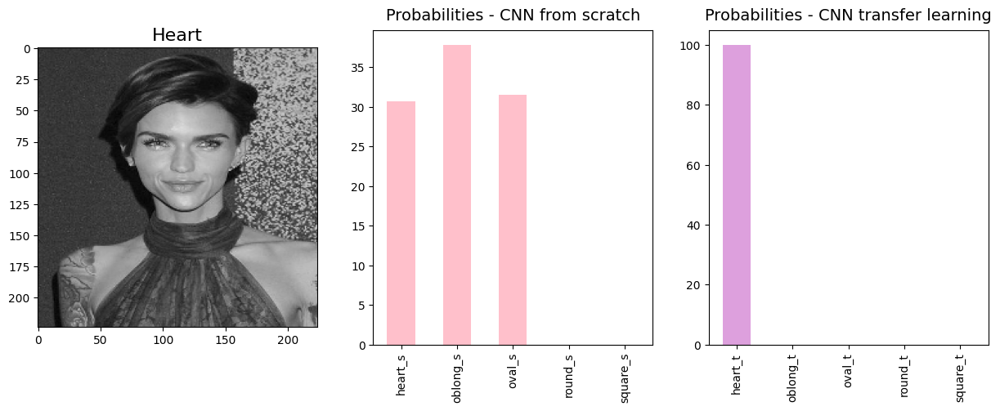

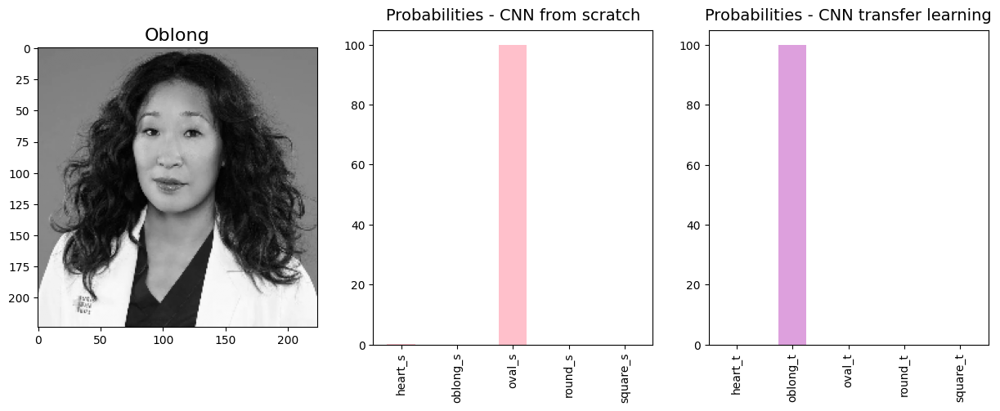

...

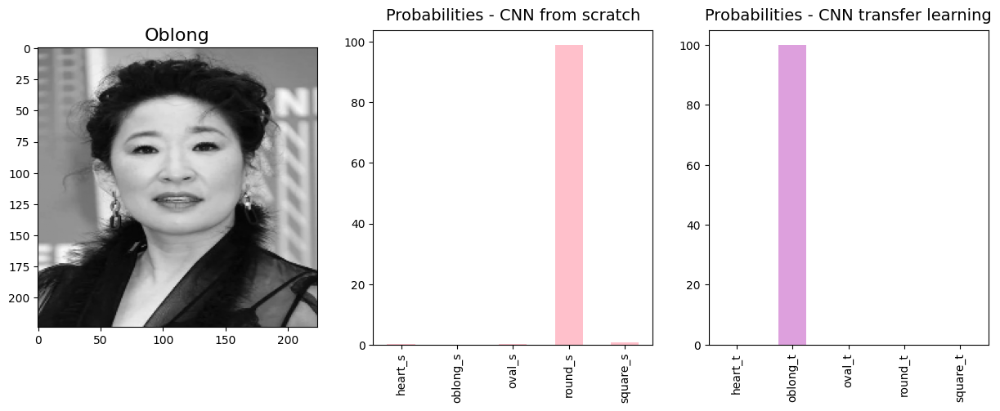

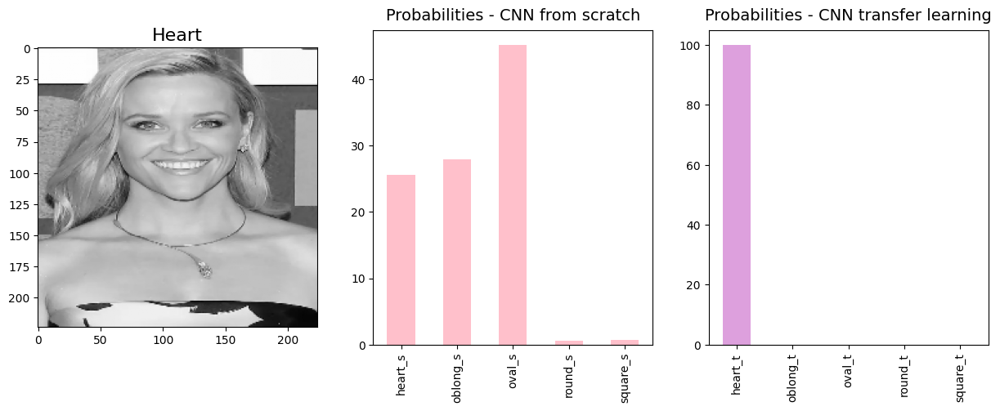

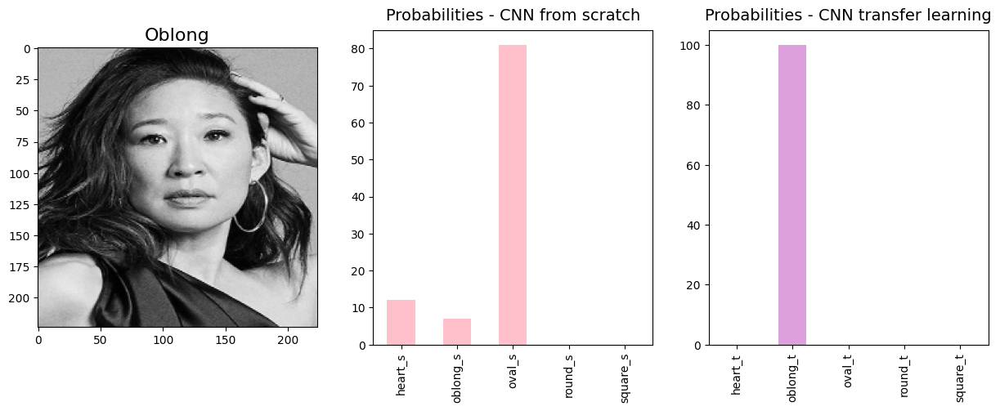

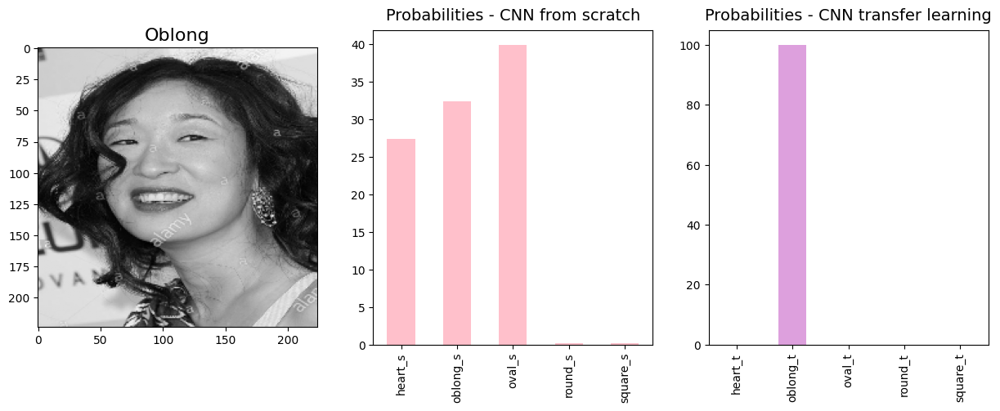

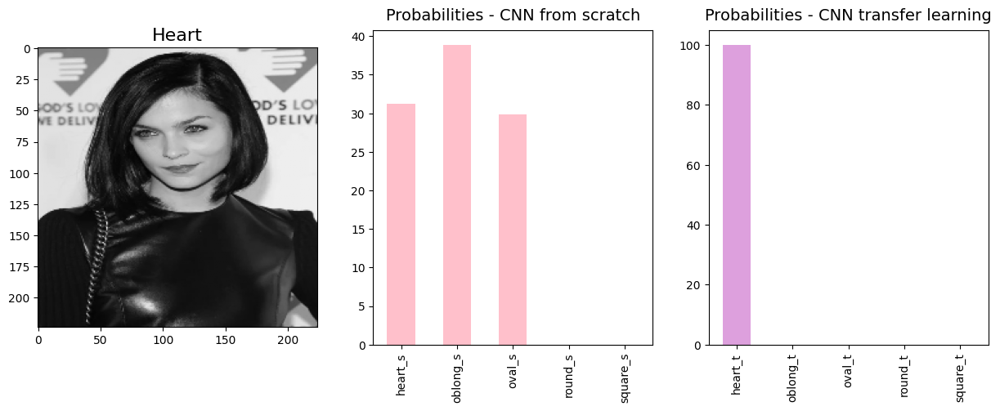

In [42]:
s_misclass_t100_index = s_misclass_t100.head(20).index
plot_misclass_img_proba(s_misclass_t100.head(20), s_misclass_t100_index)